In [150]:
import pandas as pd
import numpy as np
import librosa
import matplotlib.pyplot as plt
import os
from IPython.display import clear_output
from IPython.display import Audio

In [2]:
taxonomy = pd.read_csv('BirdCLEF/eBird_Taxonomy_v2021.csv')
metadata = pd.read_csv('BirdCLEF/train_metadata.csv')

In [3]:
import keras
model_path = 'BirdNET-Analyzer/checkpoints/V2.3/BirdNET_GLOBAL_3K_V2.3_Model'
model = keras.models.load_model(model_path, compile=False).model
embedding_model = keras.Model(inputs = model.input, outputs = model.get_layer('CONCAT_DO').output)

2023-05-26 18:39:28.960846: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/lib/python3.11/site-packages/h5py/__init__.py:36: UserWarning: h5py is running against HDF5 1.14.1 when it was built against 1.14.0, this may cause problems
  _warn(("h5py is running against HDF5 {0} when it was built against {1}, "


In [96]:
in_rectangle = ((metadata.latitude >= 25) & (metadata.latitude <= 45) & (metadata.longitude <= -80) & (metadata.longitude >= -120))

In [100]:
species = np.unique(metadata[in_rectangle].primary_label.values)

In [125]:
[len(metadata[metadata.primary_label == s]) for s in species]

[500, 38, 166, 152, 252, 59, 68, 52]

In [126]:
species

array(['barswa', 'broman1', 'categr', 'egygoo', 'greegr', 'helgui',
       'lawgol', 'pitwhy'], dtype=object)

In [298]:
f = metadata[metadata.primary_label == 'broman1'].filename.values[0]

sig, _ = librosa.load('BirdCLEF/train_audio/%s' % f, sr = 48000, res_type = 'kaiser_fast')
spec = librosa.feature.melspectrogram(y = sig, sr = 48000, fmin = 150, fmax = 15000, n_fft = 1024, hop_length = 282, n_mels = 96, norm = 100.0, power = 0.6)

In [268]:
Audio(data = sig, rate = 48000)

In [299]:
chunk_len = 3*48000
subdiv = 15
samples_per_subunit = chunk_len // subdiv
num_subunits = sig.shape[0] // samples_per_subunit
tmp = sig[0:num_subunits*samples_per_subunit].reshape(num_subunits, samples_per_subunit)
chunks = np.array([tmp[i:num_subunits-subdiv+1+i] for i in range(subdiv)]).transpose(1,0,2).reshape(-1,chunk_len)
chunks.shape

(307, 144000)

In [300]:
pred = model.predict(chunks)

10/10 [==============================] - 11s 1s/step


In [301]:
np.argmax(pred, axis = 1)

array([2822, 1553, 1553, 1553, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       1380, 2835, 1380, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2160, 2835, 2835, 2835, 2137, 2160,
       2835, 2160, 2160, 2137, 2137, 2137, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
        618, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 1555, 2835, 1555, 1555, 2835,
       2835, 2835, 2835, 2835, 2835, 2835, 1555, 28

In [333]:
label_path = 'BirdNET-Analyzer/checkpoints/V2.3/BirdNET_GLOBAL_3K_V2.3_Labels.txt'
with open(label_path) as f:
    labels = [l.replace('\n', '') for l in f.readlines()]

In [334]:
labels[2835]

'Spermestes cucullata_Bronze Mannikin'

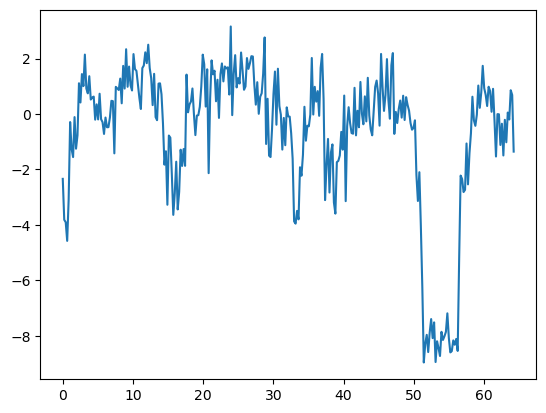

In [353]:
plt.plot(np.linspace(0,len(sig)/48000,len(pred)),pred[:,2835])
plt.show()

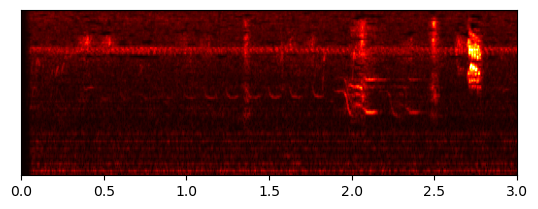

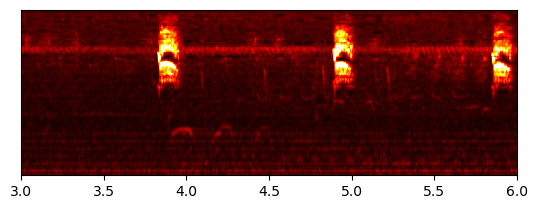

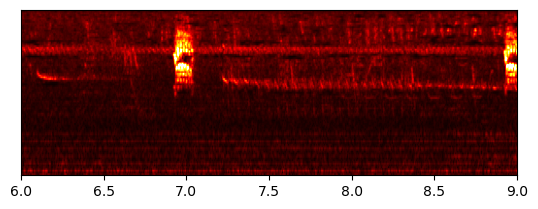

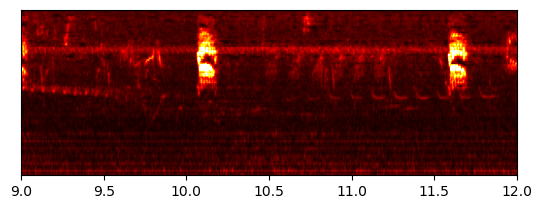

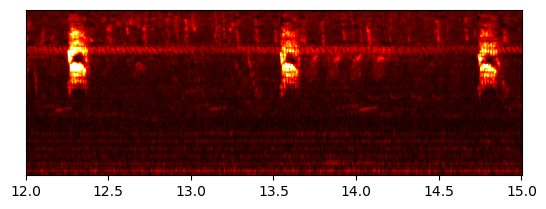

...

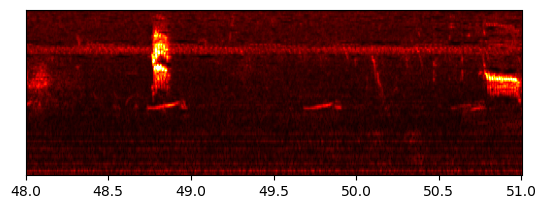

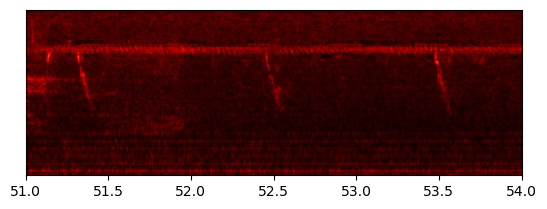

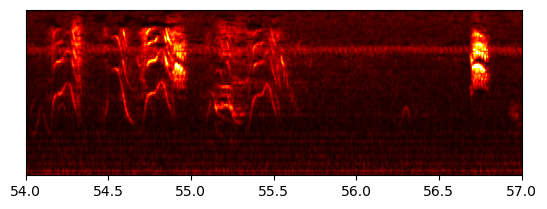

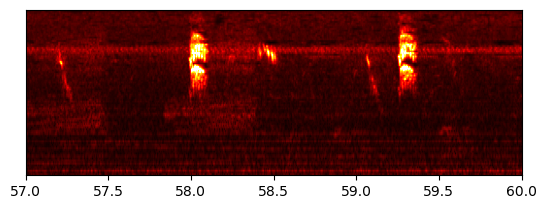

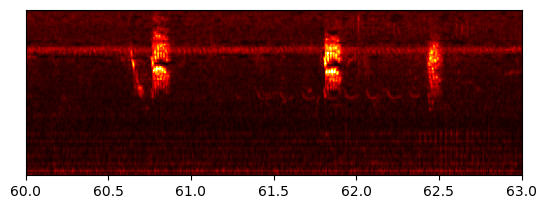

In [350]:
# 1 spectrogram time unit = 280 samples = 280/48000 seconds = 7/120 pixels
#for i in range(spec.shape[1] // 500):
#    plt.imshow(spec[::-1,i*500:(i+1)*500], cmap = 'hot', vmin = 0, vmax = 4)
#    plt.plot(np.arange(0,len(pred)*2,2), pred[int(i*175/6):,int((i+1)*175/6)])
#    plt.show()

for i in range(spec.shape[1] // 511):
    plt.yticks([])
    plt.imshow(spec[::-1,i*511:(i+1)*511], cmap = 'hot', vmin = 0, vmax = 4, extent=(i*3,(i+1)*3,0,1))
    plt.show()

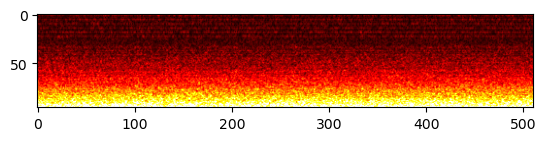

1/1 [==============================] - 0s 83ms/step


-1.9649073

In [372]:
RANDOM = np.random.RandomState(2023)
random_noise = RANDOM.normal(-0.01, 0.01, 3*48000)
noise_spec = librosa.feature.melspectrogram(y = random_noise, sr = 48000, fmin = 150, fmax = 15000, n_fft = 1024, hop_length = 282, n_mels = 96, norm = 100.0, power = 0.6)

plt.imshow(noise_spec, vmin = 0, vmax = 4, cmap = 'hot')
plt.show()

np.max(model.predict(random_noise.reshape(1,-1)))

In [392]:
chunk_len = 3*48000
subdiv = 15
samples_per_subunit = chunk_len // subdiv
num_subunits = sig.shape[0] // samples_per_subunit
tmp = sig[0:num_subunits*samples_per_subunit].reshape(num_subunits, samples_per_subunit)
chunks = np.array([tmp[i:num_subunits-subdiv+1+i] for i in range(subdiv)]).transpose(1,0,2).reshape(-1,chunk_len)
chunks.shape

(307, 144000)

In [393]:
pred = []
for i in range(1,30):
    chunks[:,144000-i*4800:] = RANDOM.normal(-0.01, 0.01, i*4800*len(chunks)).reshape(-1,i*4800)
    pred.append(model.predict(chunks))

10/10 [==============================] - 12s 1s/step


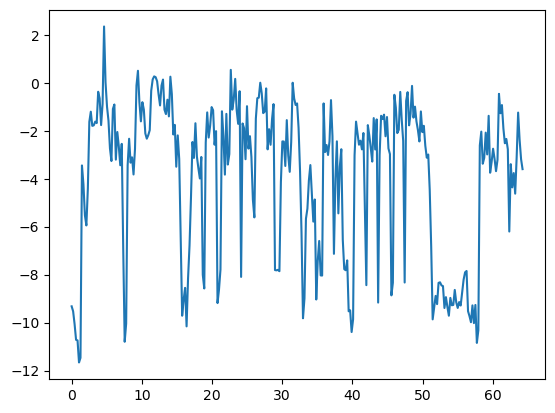

In [377]:
plt.plot(np.linspace(0,len(sig)/48000,len(pred)),pred[:,2835])
plt.show()

In [398]:
prediction = np.array(pred)

In [414]:
prediction.shape

(29, 307, 3337)

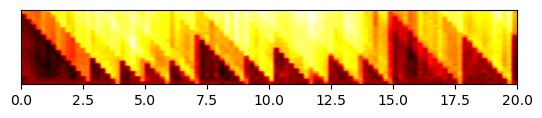

In [416]:
plt.yticks([])
plt.imshow(prediction[:,:100,2835], cmap = 'hot', extent = (0,20,0,3))

In [423]:
diff = np.clip(prediction[:,1:,2835] - prediction[:,:-1,2835],0, None)

In [482]:
diff.shape

(29, 306)

In [487]:
x = np.arange(6*8).reshape(6,8)
x.reshape(6*8)[:5*9].reshape(5,9)
x.transpose().reshape(6*8)[:6*7].reshape(6,7).transpose()

array([[ 0,  9, 18, 27, 36, 45],
       [ 8, 17, 26, 35, 44,  6],
       [16, 25, 34, 43,  5, 14],
       [24, 33, 42,  4, 13, 22],
       [32, 41,  3, 12, 21, 30],
       [40,  2, 11, 20, 29, 38],
       [ 1, 10, 19, 28, 37, 46]])

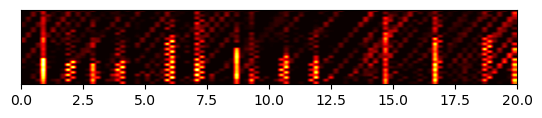

In [510]:
diff2 = np.array([np.roll(diff[i], -i//2) for i in range(29)])

plt.yticks([])
plt.imshow(diff2[:,:100], cmap = 'hot', extent = (0,20,0,3))

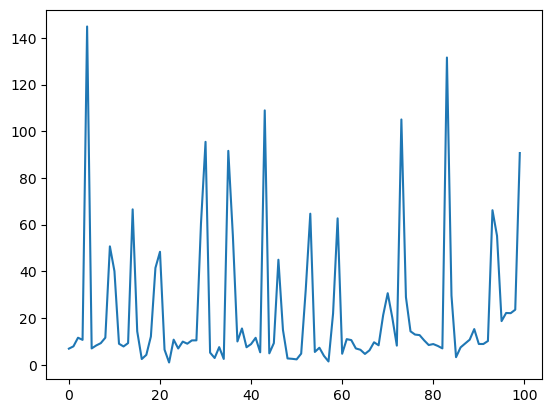

In [515]:
plt.plot(np.sum(diff2, axis = 0)[:100])